In [1]:
from sentence_transformers import SentenceTransformer, util


model = SentenceTransformer('all-MiniLM-L6-v2')
model

/home/ubuntu/git-projects/personal/github.com/elasticsearch_opensearch/.venv/lib/python3.8/site-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/home/ubuntu/git-projects/personal/github.com/elasticsearch_opensearch/.venv/lib/python3.8/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False}) with Transformer model: BertModel 
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)

In [2]:
tokenized_data = model.tokenize(['Hello World', 'My name is John'])
tokenized_data

{'input_ids': tensor([[ 101, 7592, 2088,  102,    0,    0],
         [ 101, 2026, 2171, 2003, 2198,  102]]),
 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0, 0]]),
 'attention_mask': tensor([[1, 1, 1, 1, 0, 0],
         [1, 1, 1, 1, 1, 1]])}

In [3]:
model.tokenizer.convert_ids_to_tokens(tokenized_data['input_ids'][0])
model.tokenizer.convert_ids_to_tokens(tokenized_data['input_ids'][1])

['[CLS]', 'my', 'name', 'is', 'john', '[SEP]']

In [4]:
# Transformer consists of multiple stack modules. Tokens are an input
# of the first one, so we can ignore the rest.
first_module = model._first_module()
first_module.auto_model

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 384, padding_idx=0)
    (position_embeddings): Embedding(512, 384)
    (token_type_embeddings): Embedding(2, 384)
    (LayerNorm): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-5): 6 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=384, out_features=384, bias=True)
            (key): Linear(in_features=384, out_features=384, bias=True)
            (value): Linear(in_features=384, out_features=384, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=384, out_features=384, bias=True)
            (LayerNorm): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)


# Input token embeddings

In [5]:
embeddings = first_module.auto_model.embeddings
embeddings

BertEmbeddings(
  (word_embeddings): Embedding(30522, 384, padding_idx=0)
  (position_embeddings): Embedding(512, 384)
  (token_type_embeddings): Embedding(2, 384)
  (LayerNorm): LayerNorm((384,), eps=1e-12, elementwise_affine=True)
  (dropout): Dropout(p=0.1, inplace=False)
)

In [6]:
import torch
import plotly.express as px

device = torch.device("mps" if torch.has_mps else "cpu")  # Use MPS for Apple, CUDA for others, or fallback to CPU

first_sentence = "vector search optimization"
second_sentence = "we learn to apply vector search optimization"

with torch.no_grad():
    # Tokenize both texts
    first_tokens = model.tokenize([first_sentence])
    second_tokens = model.tokenize([second_sentence])
    
    # Get the corresponding embeddings
    first_embeddings = embeddings.word_embeddings(
        first_tokens["input_ids"].to(device)
    )
    second_embeddings = embeddings.word_embeddings(
        second_tokens["input_ids"].to(device)
    )

first_embeddings.shape, second_embeddings.shape

/tmp/ipykernel_619702/1673893513.py:4: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  device = torch.device("mps" if torch.has_mps else "cpu")  # Use MPS for Apple, CUDA for others, or fallback to CPU


(torch.Size([1, 5, 384]), torch.Size([1, 9, 384]))

In [12]:
from sentence_transformers import util

distances = util.cos_sim(
    first_embeddings.squeeze(), 
    second_embeddings.squeeze()
).cpu().numpy() # Move the tensor to the CPU and convert to a NumPy array

px.imshow(
    distances, 
    x=model.tokenizer.convert_ids_to_tokens(
        second_tokens["input_ids"][0]
    ),
    y=model.tokenizer.convert_ids_to_tokens(
        first_tokens["input_ids"][0]
    ),
    text_auto=True,
)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'coloraxis': 'coloraxis',
              'hovertemplate': 'x: %{x}<br>y: %{y}<br>color: %{z}<extra></extra>',
              'name': '0',
              'texttemplate': '%{z}',
              'type': 'heatmap',
              'x': [[CLS], we, learn, to, apply, vector, search, optimization,
                    [SEP]],
              'xaxis': 'x',
              'y': [[CLS], vector, search, optimization, [SEP]],
              'yaxis': 'y',
              'z': array([[ 1.        , -0.04978333, -0.04694217,  0.01846687, -0.05316643,
                            0.08139104, -0.04390045,  0.15459642,  0.1714552 ],
                          [ 0.08139104, -0.00208866,  0.02232075, -0.01918762,  0.05942789,
                            0.99999994,  0.02914156,  0.18313345, -0.02970109],
                          [-0.04390045, -0.04238996,  0.13386655, -0.04332239,  0.08224627,
                            0.02914156,  0.99999976,  0.10303383, -0.05950047],
                          [ 0.15459642, -0.09342784, -0.04033221, -0.00931321,  0.02613158,
                            0.18313345,  0.10303383,  0.9999998 ,  0.03976255],
                          [ 0.1714552 ,  0.14372158,  0.01868758,  0.32874167, -0.03020098,
                           -0.02970109, -0.05950047,  0.03976255,  1.0000001 ]], dtype=float32)}],
    'layout': {'coloraxis': {'colorscale': [[0.0, '#0d0887'], [0.1111111111111111,
                                            '#46039f'], [0.2222222222222222,
                                            '#7201a8'], [0.3333333333333333,
                                            '#9c179e'], [0.4444444444444444,
                                            '#bd3786'], [0.5555555555555556,
                                            '#d8576b'], [0.6666666666666666,
                                            '#ed7953'], [0.7777777777777778,
                                            '#fb9f3a'], [0.8888888888888888,
                                            '#fdca26'], [1.0, '#f0f921']]},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'constrain': 'domain', 'domain': [0.0, 1.0], 'scaleanchor': 'y'},
               'yaxis': {'anchor': 'x', 'autorange': 'reversed', 'constrain': 'domain', 'domain': [0.0, 1.0]}}
})

# Notes 
- Each token is mapped to exactly the same vector - see vertical or horizontal for each token
- Positional information is again added as another layer (see below)
- However note that positional information is limited by the max lenth of the sequence as defined by the model. For e.g. if max. sequence length is 256 , and you give a sentence that is larger than 256, then it is chunked and moved to another sequence. You might lose some information because of this

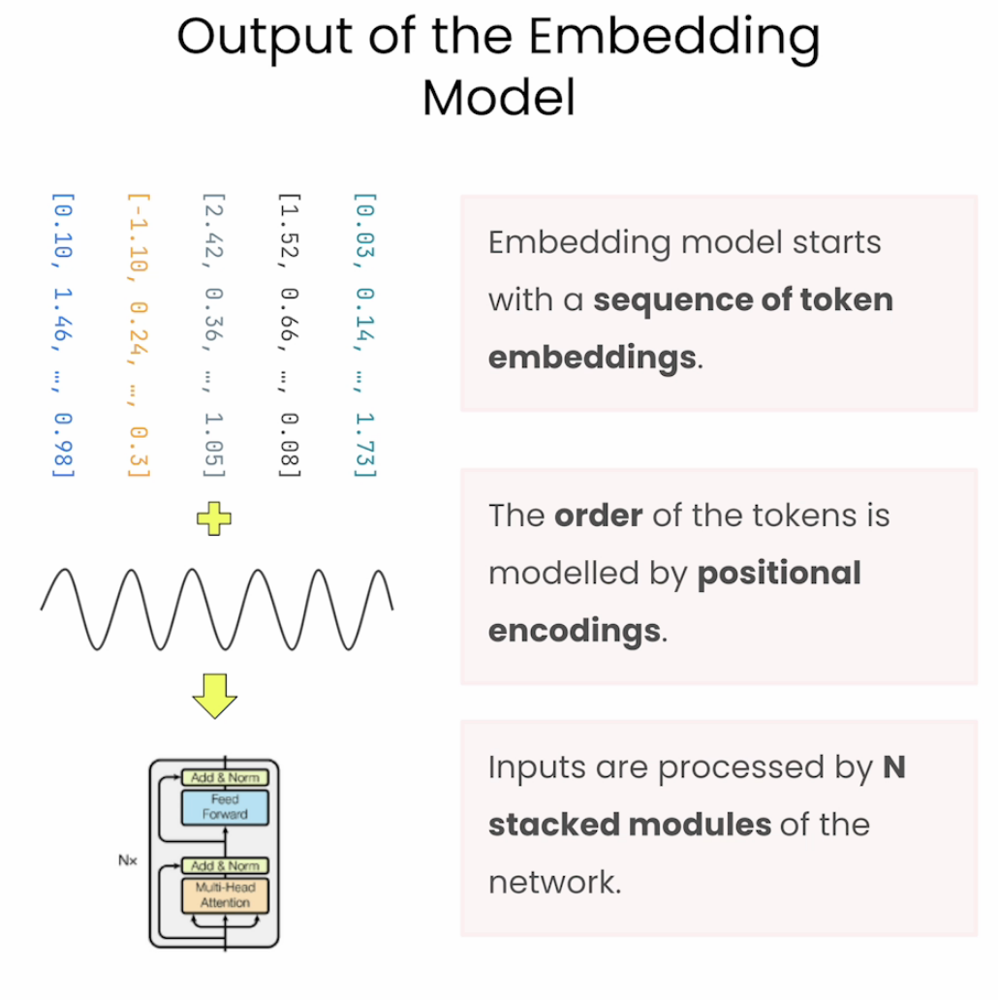

# Visualizing the input embeddings

In [7]:
token_embeddings = first_module.auto_model \
    .embeddings \
    .word_embeddings \
    .weight \
    .detach() \
    .cpu() \
    .numpy()
token_embeddings.shape

(30522, 384)

In [8]:
import random

vocabulary = first_module.tokenizer.get_vocab()
sorted_vocabulary = sorted(
    vocabulary.items(), 
    key=lambda x: x[1],  # uses the value of the dictionary entry
)
sorted_tokens = [token for token, _ in sorted_vocabulary]
random.choices(sorted_tokens, k=100)

['isolation',
 '##ワ',
 '##ssed',
 '##nets',
 '##nti',
 '##59',
 'survive',
 'bogota',
 'trademark',
 'yielding',
 '[unused914]',
 'molly',
 '324',
 'emile',
 'passive',
 'implications',
 '##nation',
 'claus',
 'gypsy',
 'wwii',
 '##yu',
 '##क',
 'ruben',
 'proceeding',
 'continue',
 'suffolk',
 '[unused662]',
 'impact',
 'taxonomic',
 '##heard',
 '##ub',
 '##hine',
 'secretary',
 'libraries',
 'martial',
 'bridgeport',
 '₅',
 'perhaps',
 'joyah',
 'ronald',
 '1632',
 '##ited',
 '##zic',
 'linger',
 'argue',
 'buffy',
 'properly',
 'grotesque',
 'recruits',
 'buildings',
 'earl',
 'flexibility',
 'fiction',
 'immune',
 'russell',
 'katrina',
 '[unused393]',
 'catalina',
 'ա',
 'diabetes',
 'soup',
 'promotes',
 'ecology',
 'augusta',
 'convoy',
 '##meyer',
 'っ',
 '##rem',
 'afar',
 'pumpkin',
 'contributes',
 'widowed',
 '##ifice',
 'yell',
 'andrey',
 'wisdom',
 '##des',
 'sec',
 'pins',
 '##kling',
 'demonstration',
 'hector',
 'elementary',
 'january',
 '80s',
 'eventual',
 'sheriff'

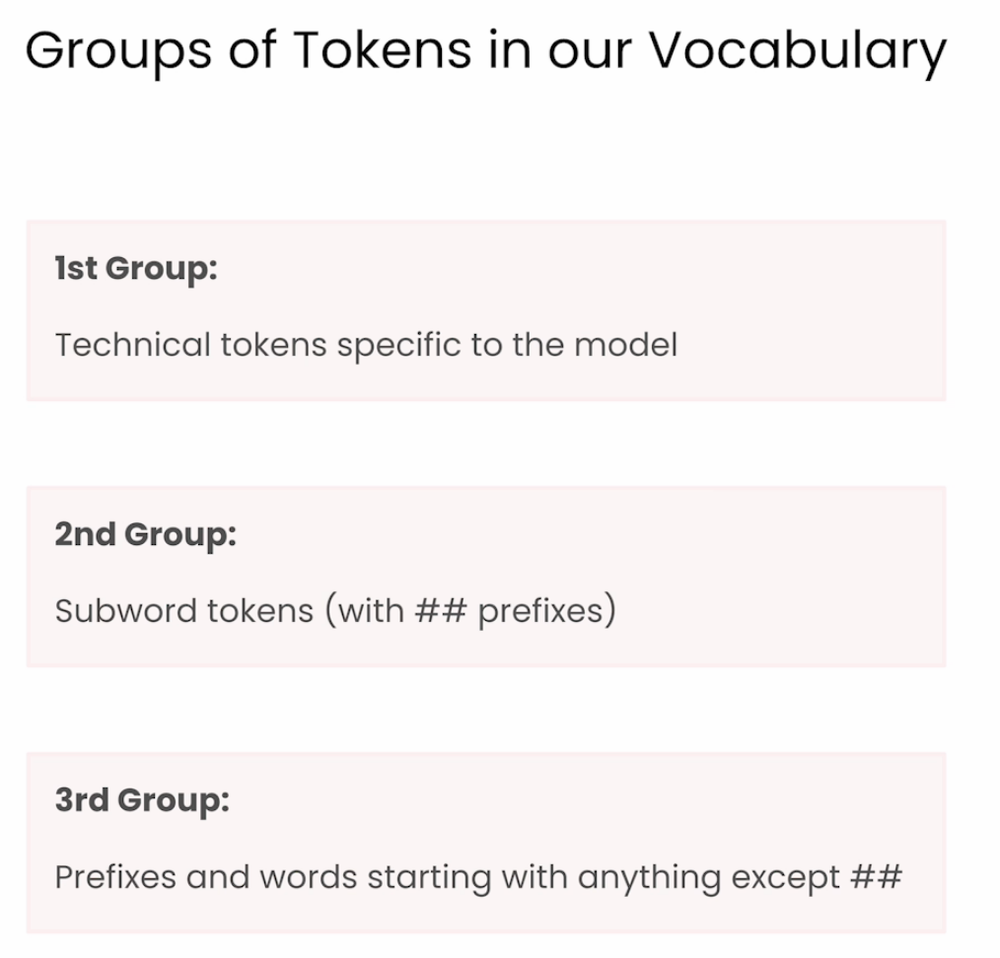

In [9]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, metric="cosine", random_state=42)
tsne_embeddings_2d = tsne.fit_transform(token_embeddings)
tsne_embeddings_2d.shape

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


(30522, 2)

In [10]:
token_colors = []
for token in sorted_tokens:
    if token[0] == "[" and token[-1] == "]":
        token_colors.append("red")
    elif token.startswith("##"):
        token_colors.append("blue")
    else:
        token_colors.append("green")

In [11]:
import plotly.graph_objs as go

scatter = go.Scattergl(
    x=tsne_embeddings_2d[:, 0], 
    y=tsne_embeddings_2d[:, 1],
    text=sorted_tokens,
    marker=dict(color=token_colors, size=3),
    mode="markers",
    name="Token embeddings",
)

fig = go.FigureWidget(
    data=[scatter],
    layout=dict(
        width=600,
        height=900,
        margin=dict(l=0, r=0),
    )
)

fig.show()

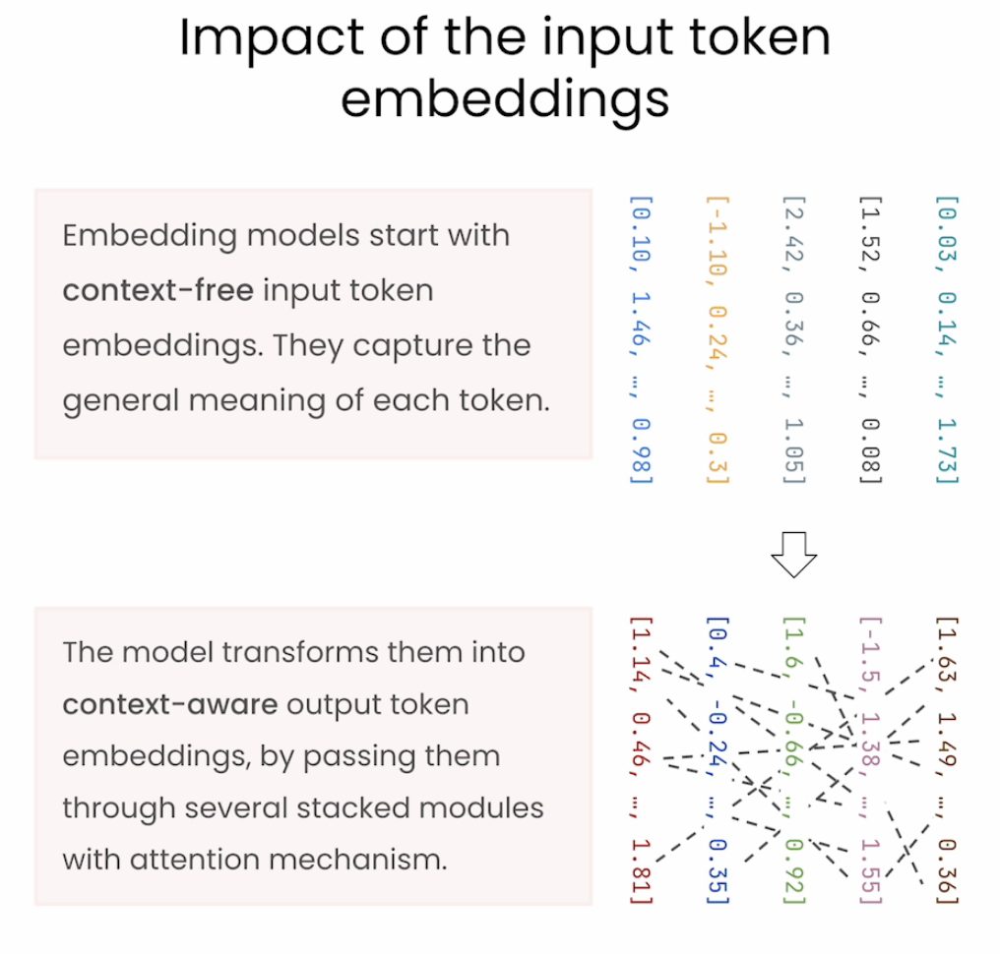

In [12]:
output_embedding = model.encode(["walker walked a long walk"])
output_embedding.shape

(1, 384)

In [13]:
output_token_embeddings = model.encode(
    ["walker walked a long walk"], 
    output_value="token_embeddings"
)
output_token_embeddings[0].shape

torch.Size([7, 384])

In [16]:
from sentence_transformers import SentenceTransformer, util
first_sentence = "vector search optimization"
second_sentence = "we learn to apply vector search optimization"

with torch.no_grad():
    first_tokens = model.tokenize([first_sentence])
    second_tokens = model.tokenize([second_sentence])
    
    first_embeddings = model.encode(
        [first_sentence], 
        output_value="token_embeddings"
    )
    second_embeddings = model.encode(
        [second_sentence], 
        output_value="token_embeddings"
    )

distances = util.cos_sim(
    first_embeddings[0], 
    second_embeddings[0]
)

In [17]:
px.imshow(
    distances.cpu().numpy(),  # Move the tensor to CPU and convert to a NumPy array
    x=model.tokenizer.convert_ids_to_tokens(
        second_tokens["input_ids"][0]
    ),
    y=model.tokenizer.convert_ids_to_tokens(
        first_tokens["input_ids"][0]
    ),
    text_auto=True,
)

# Takeways
- Though same words might be present in two different sentences, their vectors are not the same (because more layers transform the initial context-free token vectors into various other vectors (aka. `attention mechanism` in transformers))